In [1]:
!uv pip install geopandas folium matplotlib mapclassify

Resolved 34 packages in 148ms                                        
⠙ Preparing packages... (0/3)                                                   
⠙ Preparing packages... (0/3)------     0 B/12.35 MiB                   
⠙ Preparing packages... (0/3)------ 2.69 KiB/12.35 MiB                  
⠙ Preparing packages... (0/3)------ 6.73 KiB/12.35 MiB                  
⠙ Preparing packages... (0/3)------ 10.77 KiB/12.35 MiB                 
⠙ Preparing packages... (0/3)------ 14.80 KiB/12.35 MiB                 
⠙ Preparing packages... (0/3)------ 14.91 KiB/12.35 MiB                 
networkx   ------------------------------     0 B/1.62 MiB
⠙ Preparing packages... (0/3)------ 14.91 KiB/12.35 MiB                 
networkx   ------------------------------     0 B/1.62 MiB
scikit-learn ------------------------------ 14.91 KiB/12.35 MiB
⠙ Preparing packages... (0/3)----     0 B/38.96 MiB                     
networkx   ------------------------------ 8.00 KiB/1.62 MiB
scikit-learn ----------

In [2]:
import geopandas as gpd
import pandas as pd

In [3]:
denuncias = pd.read_csv("../data/processed/denuncias.csv")
establecimientos = pd.read_csv("../data/processed/establecimientos.csv")
matriculas = pd.read_csv("../data/processed/matriculas.csv")
sep_ee = pd.read_csv("../data/processed/sep_establecimientos.csv")

In [4]:
establecimientos

,Unnamed: 0,agno,rbd,nom_rbd,cod_reg_rbd,cod_com_rbd,nom_com_rbd,cod_depe,cod_depe2,rural_rbd,latitud,longitud,convenio_pie,ori_religiosa,pago_matricula,pago_mensual
0,0,2014,1,LICEO POLITECNICO ARICA,15,15101,ARICA,2,1,0,-18.487274,-70.294739,1,2,1,1
1,1,2014,2,PARVULARIO LAS ESPIGUITAS,15,15101,ARICA,2,1,0,-18.469862,-70.302757,1,2,1,1
2,2,2014,3,ESC. PEDRO VICENTE GUTIERREZ TORRES,15,15101,ARICA,2,1,1,-18.503580,-70.260826,0,2,1,1
3,3,2014,4,LICEO OCTAVIO PALMA PEREZ,15,15101,ARICA,2,1,0,-18.474243,-70.308266,1,1,1,1
4,4,2014,5,JOVINA NARANJO FERNANDEZ,15,15101,ARICA,2,1,0,-18.476904,-70.313454,1,7,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158420,158420,2023,42195,SALA CUNA Y JARDIN INFANTIL ARBOLITO,13,13130,SAN MIGUEL,4,3,0,NaN,NaN,0,9,0,0
158421,158421,2023,42196,SALA CUNA QUITRAL MONTESSORI,13,13302,LAMPA,4,3,0,NaN,NaN,0,9,0,0
158422,158422,2023,42197,SALA CUNA NIDO ALEXANDER MONTESSORI,13,13114,LAS CONDES,4,3,0,NaN,NaN,0,9,0,0
158423,158423,2023,42198,COLEGIO DE ADULTOS AMANECER,13,13124,PUDAHUEL,3,2,0,NaN,NaN,0,9,0,0


In [5]:
establecimientos["longitud"] = establecimientos["longitud"].replace(0, pd.NA)
establecimientos["latitud"] = establecimientos["latitud"].replace(0, pd.NA)

In [6]:
establecimientos["longitud"] = pd.to_numeric(establecimientos["longitud"])
establecimientos["latitud"] = pd.to_numeric(establecimientos["latitud"])

In [7]:
latest_data = establecimientos.sort_values('agno').groupby('rbd').last().reset_index()

In [8]:
latest_data

,rbd,Unnamed: 0,agno,nom_rbd,cod_reg_rbd,cod_com_rbd,nom_com_rbd,cod_depe,cod_depe2,rural_rbd,latitud,longitud,convenio_pie,ori_religiosa,pago_matricula,pago_mensual
0,1,141766,2023,LICEO POLITECNICO ARICA,15,15101,ARICA,6,5,0,-18.487200,-70.295212,1,2,1,1
1,2,141767,2023,PARVULARIO LAS ESPIGUITAS,15,15101,ARICA,6,5,0,-18.469862,-70.302757,1,2,1,1
2,3,141768,2023,ESC. PEDRO VICENTE GUTIERREZ TORRES,15,15101,ARICA,6,5,1,-18.503580,-70.260826,0,1,1,1
3,4,141769,2023,LICEO OCTAVIO PALMA PEREZ,15,15101,ARICA,6,5,0,-18.474239,-70.308273,1,1,1,1
4,5,141770,2023,JOVINA NARANJO FERNANDEZ,15,15101,ARICA,6,5,0,-18.476900,-70.313454,1,7,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16693,42195,158420,2023,SALA CUNA Y JARDIN INFANTIL ARBOLITO,13,13130,SAN MIGUEL,4,3,0,NaN,NaN,0,9,0,0
16694,42196,158421,2023,SALA CUNA QUITRAL MONTESSORI,13,13302,LAMPA,4,3,0,NaN,NaN,0,9,0,0
16695,42197,158422,2023,SALA CUNA NIDO ALEXANDER MONTESSORI,13,13114,LAS CONDES,4,3,0,NaN,NaN,0,9,0,0
16696,42198,158423,2023,COLEGIO DE ADULTOS AMANECER,13,13124,PUDAHUEL,3,2,0,NaN,NaN,0,9,0,0


In [9]:
latest_data[latest_data["agno"] == 2023]["rbd"].nunique()

16659

In [10]:
gdf_establecimientos = gpd.GeoDataFrame(latest_data.dropna(subset=['longitud', "latitud"]), geometry=gpd.points_from_xy(latest_data.dropna(subset=['longitud', "latitud"])["longitud"], latest_data.dropna(subset=['longitud', "latitud"])["latitud"]), crs="EPSG:4326")

In [11]:
gdf_establecimientos.head(3)

,rbd,Unnamed: 0,agno,nom_rbd,cod_reg_rbd,cod_com_rbd,nom_com_rbd,cod_depe,cod_depe2,rural_rbd,latitud,longitud,convenio_pie,ori_religiosa,pago_matricula,pago_mensual,geometry
0,1,141766,2023,LICEO POLITECNICO ARICA,15,15101,ARICA,6,5,0,-18.487200,-70.295212,1,2,1,1,POINT (-70.29521 -18.4872)
1,2,141767,2023,PARVULARIO LAS ESPIGUITAS,15,15101,ARICA,6,5,0,-18.469862,-70.302757,1,2,1,1,POINT (-70.30276 -18.46986)
2,3,141768,2023,ESC. PEDRO VICENTE GUTIERREZ TORRES,15,15101,ARICA,6,5,1,-18.503580,-70.260826,0,1,1,1,POINT (-70.26083 -18.50358)


In [12]:
gdf_establecimientos.explore()

In [13]:
denuncias.drop(columns=["Unnamed: 0"], inplace=True)
establecimientos.drop(columns=["Unnamed: 0"], inplace=True)
matriculas.drop(columns=["Unnamed: 0"], inplace=True)
sep_ee.drop(columns=["Unnamed: 0"], inplace=True)

In [14]:
display(denuncias.head(1))
display(establecimientos.head(1))
display(matriculas.head(1))
display(sep_ee.head(1))

,agno,den_canal,den_estado,den_fec_creacion,den_fec_termino_denuncia,den_oficina,den_departamento,den_ambito,den_tema,den_subtema,den_sexo,rbd
0,2014,1,1,2014-01-02,2014-01-08,2,1,CONVIVENCIA,MEDIDAS DISCIPLINARIAS,NO RENOVACIÓN O CANCELACIÓN DE MATRÍCULA A PÁR...,2,283.0


,agno,rbd,nom_rbd,cod_reg_rbd,cod_com_rbd,nom_com_rbd,cod_depe,cod_depe2,rural_rbd,latitud,longitud,convenio_pie,ori_religiosa,pago_matricula,pago_mensual
0,2014,1,LICEO POLITECNICO ARICA,15,15101,ARICA,2,1,0,-18.487274,-70.294739,1,2,1,1


,agno,rbd,nom_rbd,mat_hom_1,mat_muj_1,mat_hom_2,mat_muj_2,mat_hom_3,mat_muj_3,mat_hom_4,...,mat_muj_5,mat_hom_6,mat_muj_6,mat_hom_7,mat_muj_7,mat_hom_8,mat_muj_8,mat_hom_tot,mat_muj_tot,mat_total
0,2022,1,LICEO POLITECNICO ARICA,0,0,0,0,0,0,0,...,0,0,0,317,171,83,96,400,267,667


,agno,rbd,clasificacion_sep,n_prio,n_ben,convenio_sep,n_prio_ben,n_pref,n_pref_ben
0,2014,1,EMERGENTE,655,195,NaN,NaN,NaN,NaN


In [15]:
denuncias.columns

Index(['agno', 'den_canal', 'den_estado', 'den_fec_creacion',
       'den_fec_termino_denuncia', 'den_oficina', 'den_departamento',
       'den_ambito', 'den_tema', 'den_subtema', 'den_sexo', 'rbd'],
      dtype='object')

## Denuncias

<Axes: xlabel='agno'>

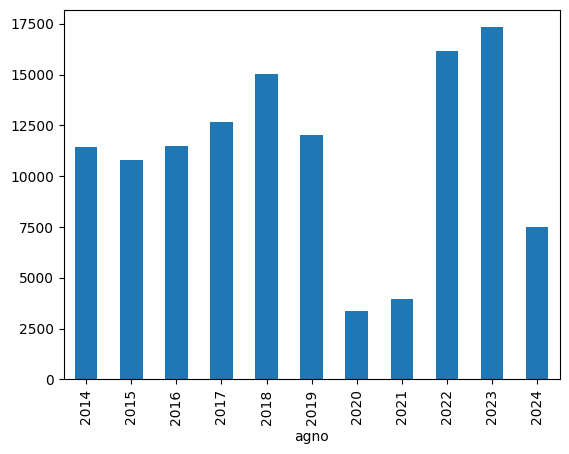

In [16]:
denuncias.groupby(["agno"]).size().plot(kind='bar')

<Axes: ylabel='den_ambito'>

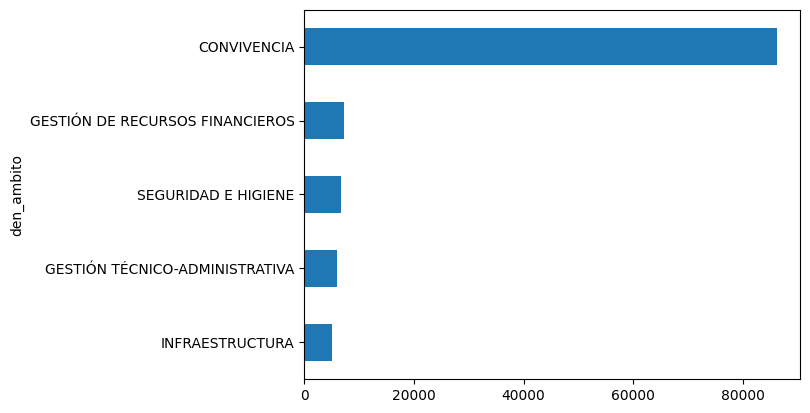

In [17]:
denuncias.groupby(["den_ambito"]).size().sort_values(ascending=True)[-5:].plot(kind='barh', )

<Axes: ylabel='den_tema'>

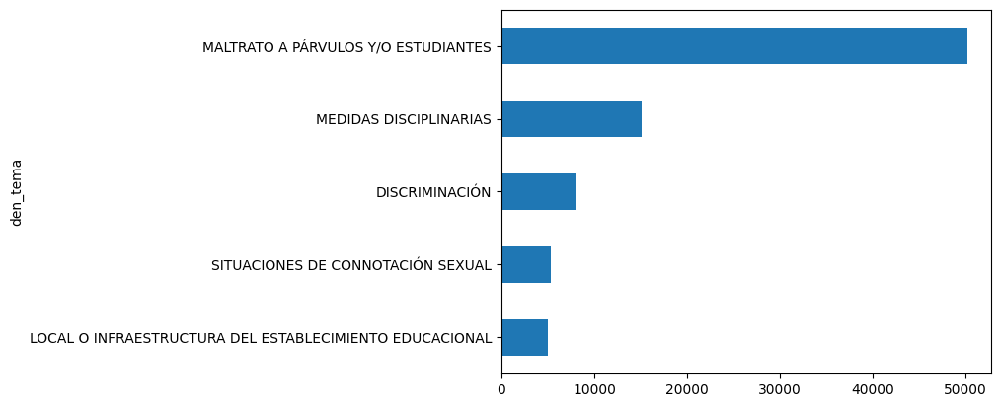

In [18]:
denuncias.groupby(["den_tema"]).size().sort_values(ascending=True)[-5:].plot(kind='barh', )

<Axes: ylabel='den_subtema'>

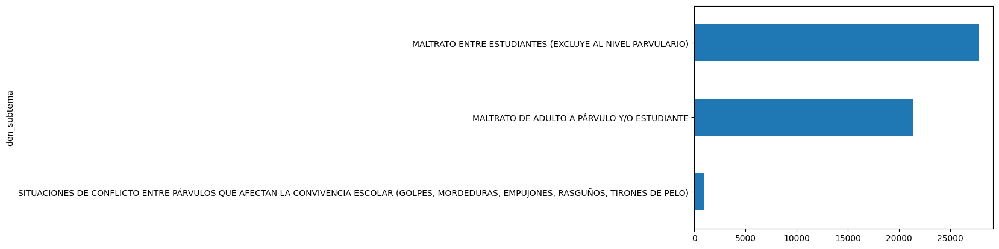

In [19]:
denuncias[denuncias["den_tema"] == "MALTRATO A PÁRVULOS Y/O ESTUDIANTES"].groupby(["den_subtema"]).size().sort_values(ascending=True)[-5:].plot(kind='barh', )

In [20]:
denuncias["den_fec_creacion"] = pd.to_datetime(denuncias["den_fec_creacion"])
denuncias["den_fec_termino_denuncia"] = pd.to_datetime(denuncias["den_fec_termino_denuncia"])

In [21]:
denuncias["duracion_denuncia"] = (denuncias["den_fec_termino_denuncia"] - denuncias["den_fec_creacion"]).dt.days

In [22]:
%pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

In [24]:
category_map = {
    1: '01: Protección de Derechos Educacionales',
    2: '02: Fiscalización',
    3: '03: Jurídica'
}
denuncias["den_departamento"] = denuncias["den_departamento"].map(category_map)

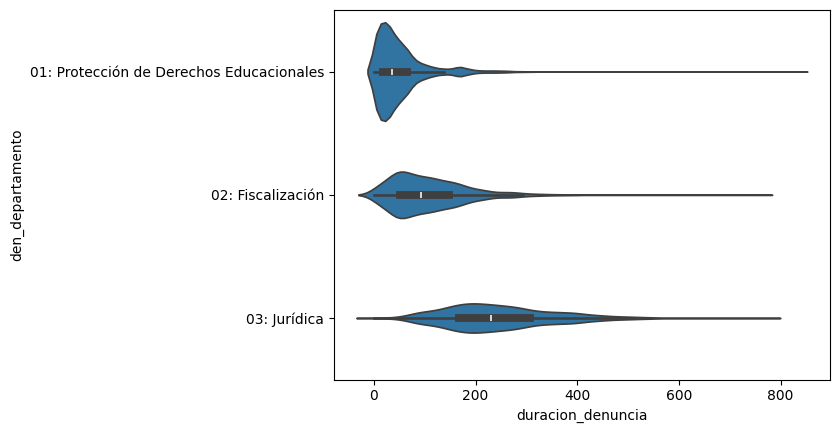

In [25]:
order = ['01: Protección de Derechos Educacionales', '02: Fiscalización', '03: Jurídica']


sns.violinplot(y=denuncias[denuncias["den_tema"] == "MALTRATO A PÁRVULOS Y/O ESTUDIANTES"]["den_departamento"], x=denuncias[denuncias["den_tema"] == "MALTRATO A PÁRVULOS Y/O ESTUDIANTES"]["duracion_denuncia"], order=order)
plt.show()

Destacar el porcentaje de denuncias que se demoran más en resolver

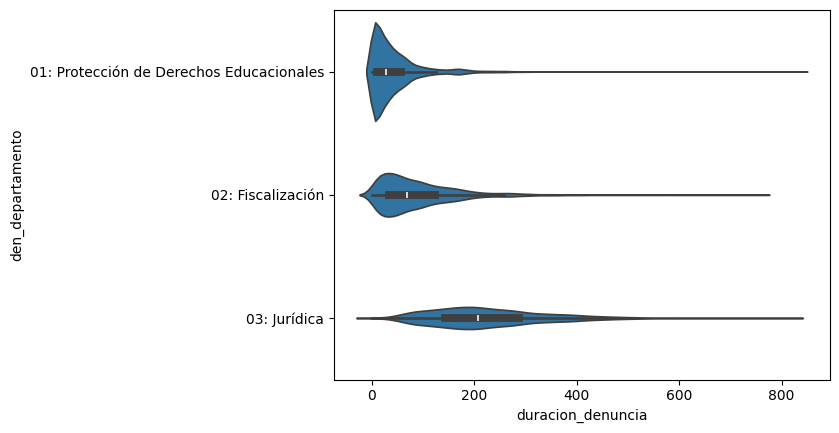

In [26]:
order = ['01: Protección de Derechos Educacionales', '02: Fiscalización', '03: Jurídica']


sns.violinplot(y=denuncias["den_departamento"], x=denuncias["duracion_denuncia"], order=order)
plt.show()

### Denuncias por matrícula

In [27]:
display(denuncias["rbd"].nunique())
display(denuncias[denuncias["agno"]==2023]["rbd"].nunique())

10221

5388

In [28]:
denuncias_agno_rbd = denuncias.drop(columns=['den_fec_creacion','den_fec_termino_denuncia']).groupby(["agno", "rbd"]).agg({'rbd':'count'}).rename(columns={'rbd': 'total_denuncias'}).reset_index()

In [29]:
matriculas = matriculas.merge(denuncias_agno_rbd, on=["agno", "rbd"])

In [30]:
matriculas[matriculas["agno"] == 2023]["rbd"].nunique()

5255

In [31]:
matriculas_totales = matriculas.groupby(["rbd"]).agg({'mat_total':'sum', 'total_denuncias':'sum'}).reset_index()

In [32]:
matriculas_totales

,rbd,mat_total,total_denuncias
0,1,11348,46
1,2,770,4
2,4,17202,52
3,5,16042,52
4,7,19872,56
...,...,...,...
9653,42133,0,2
9654,42162,624,2
9655,42175,0,2
9656,42178,320,8


<Axes: ylabel='Frequency'>

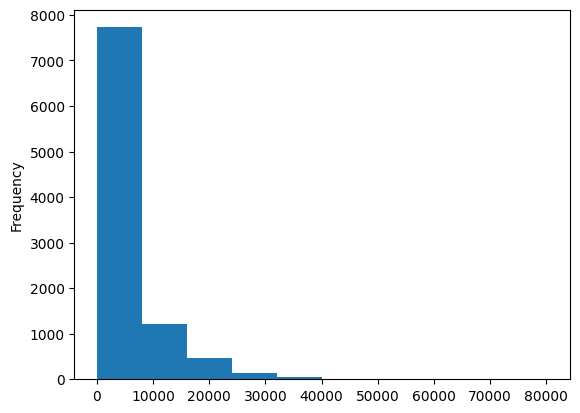

In [33]:
matriculas_totales['mat_total'].plot(kind="hist")

In [34]:
matriculas_totales['mat_total'] = pd.to_numeric(matriculas_totales['mat_total'].replace(0, pd.NA))

In [35]:
import numpy as np

matriculas_totales["den_per_100"] = matriculas_totales["total_denuncias"].divide(matriculas_totales['mat_total']*0.01).replace(np.inf, 0)

In [36]:

matriculas_totales.merge(latest_data, on="rbd").head(2)

,rbd,mat_total,total_denuncias,den_per_100,Unnamed: 0,agno,nom_rbd,cod_reg_rbd,cod_com_rbd,nom_com_rbd,cod_depe,cod_depe2,rural_rbd,latitud,longitud,convenio_pie,ori_religiosa,pago_matricula,pago_mensual
0,1,11348.0,46,0.405358,141766,2023,LICEO POLITECNICO ARICA,15,15101,ARICA,6,5,0,-18.487200,-70.295212,1,2,1,1
1,2,770.0,4,0.519481,141767,2023,PARVULARIO LAS ESPIGUITAS,15,15101,ARICA,6,5,0,-18.469862,-70.302757,1,2,1,1


In [37]:
matriculas_denuncias = matriculas_totales.merge(latest_data, on="rbd")

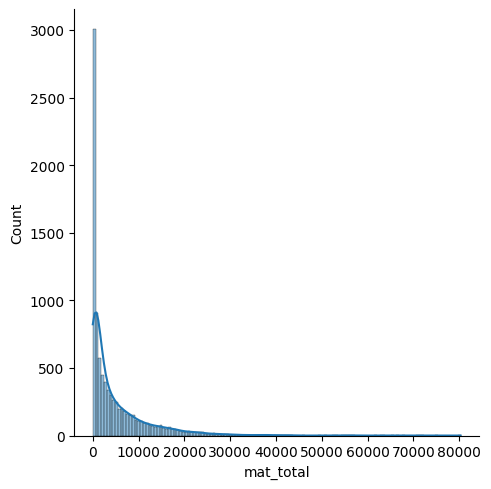

In [38]:

sns.displot(data=matriculas_denuncias["mat_total"], kde=True)

In [39]:
latest_data

,rbd,Unnamed: 0,agno,nom_rbd,cod_reg_rbd,cod_com_rbd,nom_com_rbd,cod_depe,cod_depe2,rural_rbd,latitud,longitud,convenio_pie,ori_religiosa,pago_matricula,pago_mensual
0,1,141766,2023,LICEO POLITECNICO ARICA,15,15101,ARICA,6,5,0,-18.487200,-70.295212,1,2,1,1
1,2,141767,2023,PARVULARIO LAS ESPIGUITAS,15,15101,ARICA,6,5,0,-18.469862,-70.302757,1,2,1,1
2,3,141768,2023,ESC. PEDRO VICENTE GUTIERREZ TORRES,15,15101,ARICA,6,5,1,-18.503580,-70.260826,0,1,1,1
3,4,141769,2023,LICEO OCTAVIO PALMA PEREZ,15,15101,ARICA,6,5,0,-18.474239,-70.308273,1,1,1,1
4,5,141770,2023,JOVINA NARANJO FERNANDEZ,15,15101,ARICA,6,5,0,-18.476900,-70.313454,1,7,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16693,42195,158420,2023,SALA CUNA Y JARDIN INFANTIL ARBOLITO,13,13130,SAN MIGUEL,4,3,0,NaN,NaN,0,9,0,0
16694,42196,158421,2023,SALA CUNA QUITRAL MONTESSORI,13,13302,LAMPA,4,3,0,NaN,NaN,0,9,0,0
16695,42197,158422,2023,SALA CUNA NIDO ALEXANDER MONTESSORI,13,13114,LAS CONDES,4,3,0,NaN,NaN,0,9,0,0
16696,42198,158423,2023,COLEGIO DE ADULTOS AMANECER,13,13124,PUDAHUEL,3,2,0,NaN,NaN,0,9,0,0


In [40]:
smallest_10pc_mat_den = matriculas_denuncias.nsmallest(n=int(len(matriculas_denuncias) * 0.1), columns="mat_total")

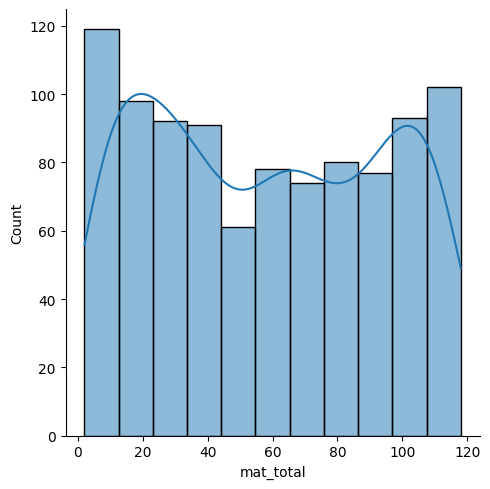

In [41]:
sns.displot(data=smallest_10pc_mat_den["mat_total"], kde=True)

El 10% de los datos corresponden a EE que no han tenido más de 50 matrículas

In [42]:
mat_den_flitered = matriculas_denuncias[matriculas_denuncias["mat_total"] > 50]

In [43]:
matriculas_denuncias.sort_values(by=["den_per_100"], ascending=False).head(2)

,rbd,mat_total,total_denuncias,den_per_100,Unnamed: 0,agno,nom_rbd,cod_reg_rbd,cod_com_rbd,nom_com_rbd,cod_depe,cod_depe2,rural_rbd,latitud,longitud,convenio_pie,ori_religiosa,pago_matricula,pago_mensual
52,87,2.0,6,300.0,141834,2023,ESCUELA ANCOLACANE,15,15202,GENERAL LAGOS,6,5,1,-17.854719,-69.606133,0,2,1,1
6174,14886,2.0,6,300.0,152482,2023,ESCUELA DE PARVULOS LILIPUT,5,5501,QUILLOTA,3,2,0,-32.873867,-71.244316,0,1,4,5


In [44]:
mat_den_flitered.sort_values(by=["den_per_100"], ascending=False).head(2)

,rbd,mat_total,total_denuncias,den_per_100,Unnamed: 0,agno,nom_rbd,cod_reg_rbd,cod_com_rbd,nom_com_rbd,cod_depe,cod_depe2,rural_rbd,latitud,longitud,convenio_pie,ori_religiosa,pago_matricula,pago_mensual
7343,20473,112.0,42,37.50000,154383,2023,COLEGIO SAN BENITO,7,7101,TALCA,3,2,0,-35.440090,-71.670670,0,9,0,0
9633,41919,54.0,16,29.62963,158265,2023,COLEGIO HODGKINSON,6,6106,GRANEROS,3,2,0,-70.727409,-34.073351,0,1,1,1


<Axes: xlabel='den_per_100', ylabel='nom_rbd'>

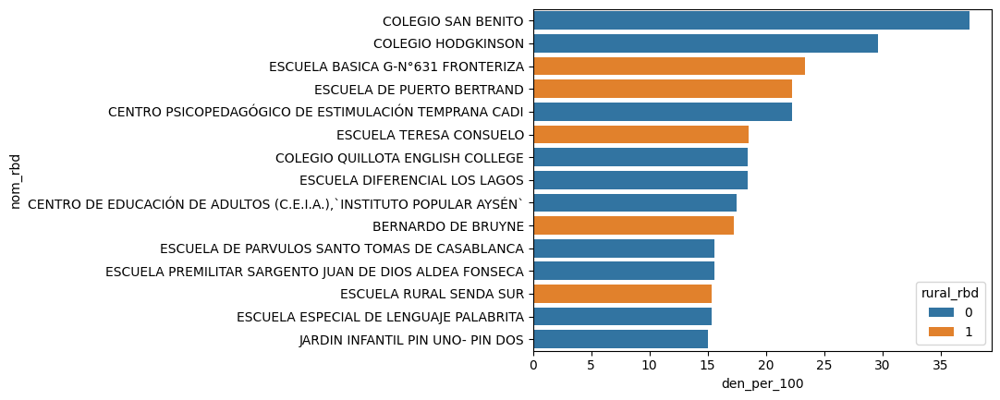

In [45]:
largest_mat_den = mat_den_flitered.nlargest(n=15, columns=["den_per_100"])

sns.barplot(x=largest_mat_den["den_per_100"], y=largest_mat_den["nom_rbd"],orient="h", hue=largest_mat_den["rural_rbd"])

<Axes: xlabel='total_denuncias', ylabel='nom_rbd'>

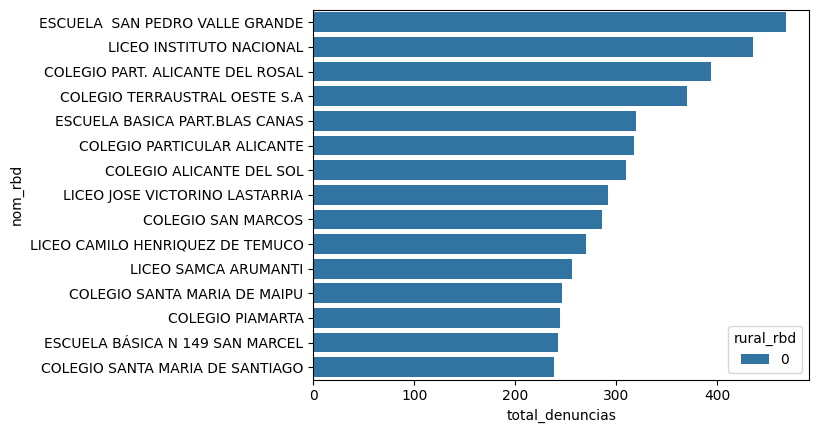

In [46]:
largest_tot_den = mat_den_flitered.nlargest(n=15, columns=["total_denuncias"])

sns.barplot(x=largest_tot_den["total_denuncias"], y=largest_tot_den["nom_rbd"],orient="h", hue=largest_tot_den["rural_rbd"])

In [47]:
largest10_tot_den = mat_den_flitered.nlargest(n=int(len(mat_den_flitered)* 0.1), columns=["total_denuncias"])
largest10_den_per_100 = mat_den_flitered.nlargest(n=int(len(mat_den_flitered)* 0.1), columns=["den_per_100"])

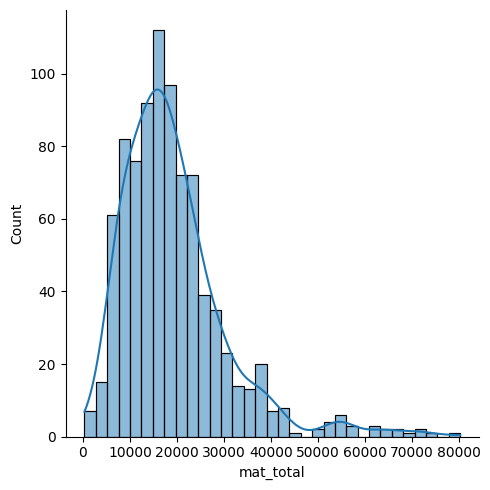

In [48]:
sns.displot(data=largest10_tot_den["mat_total"], kde=True)

<Axes: xlabel='mat_total', ylabel='Count'>

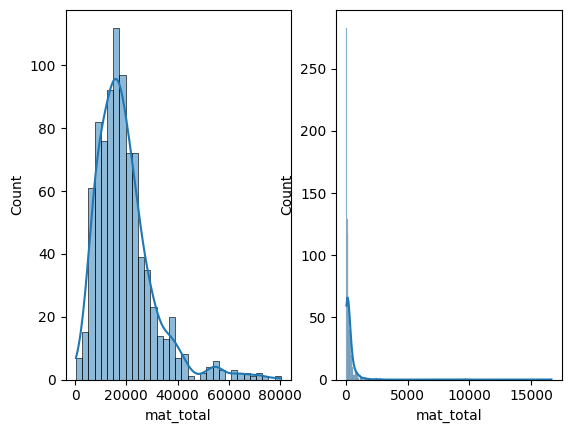

In [49]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(ncols=2)
sns.histplot(data=largest10_tot_den["mat_total"], kde=True, ax=axs[0])
sns.histplot(data=largest10_den_per_100["mat_total"], kde=True, ax=axs[1])


<Axes: xlabel='pago_matricula'>

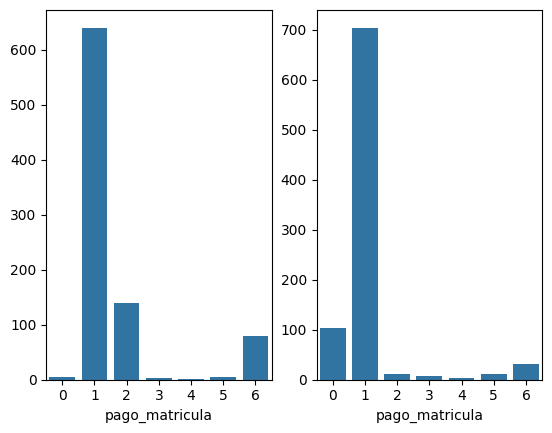

In [50]:
fig, axs = plt.subplots(ncols=2)
sns.barplot(data=largest10_tot_den.groupby(["pago_matricula"]).size(), ax=axs[0])
sns.barplot(data=largest10_den_per_100.groupby(["pago_matricula"]).size(), ax=axs[1])

<Axes: xlabel='pago_mensual'>

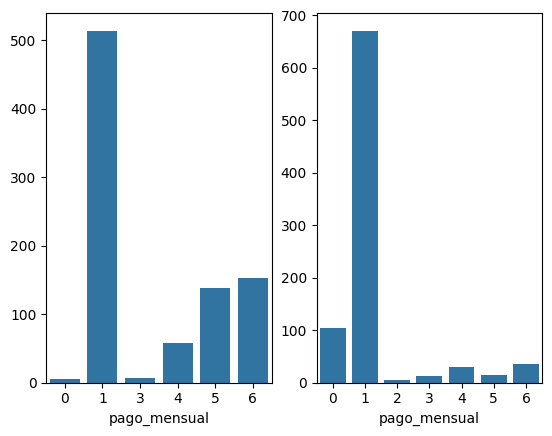

In [51]:
fig, axs = plt.subplots(ncols=2)
sns.barplot(data=largest10_tot_den.groupby(["pago_mensual"]).size(), ax=axs[0])
sns.barplot(data=largest10_den_per_100.groupby(["pago_mensual"]).size(), ax=axs[1])

<Axes: xlabel='pago_mensual'>

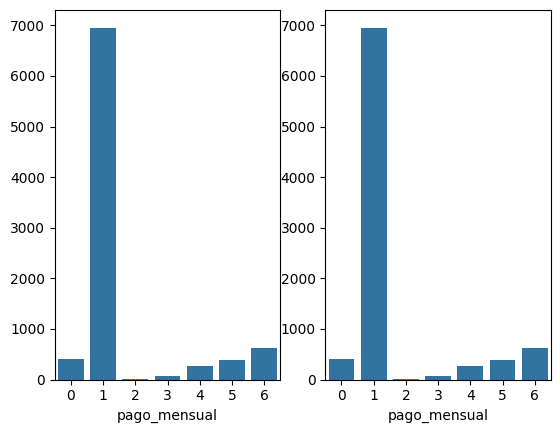

In [52]:
fig, axs = plt.subplots(ncols=2)
sns.barplot(data=mat_den_flitered.groupby(["pago_mensual"]).size(), ax=axs[0])
sns.barplot(data=mat_den_flitered.groupby(["pago_mensual"]).size(), ax=axs[1])